In [18]:
from PIL import Image

In [19]:
mac = Image.open('example.jpg')

In [20]:
# Note this is a specialized file type from PIL (pillow)
type(mac)

PIL.JpegImagePlugin.JpegImageFile

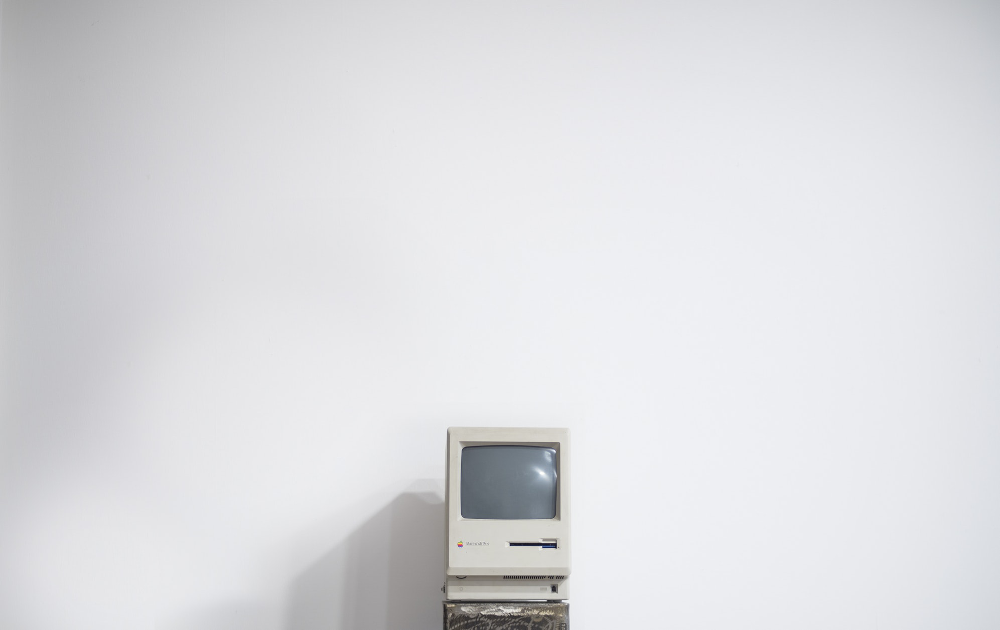

In [21]:
# Only for jupyter notebook , use mac.show() for other IDEs 
mac

### Image Information

In [22]:
# (width, height)
mac.size

(1993, 1257)

In [23]:
mac.filename

'example.jpg'

In [24]:
mac.format_description

'JPEG (ISO 10918)'

## Cropping Images

To crop images (that is grab a sub section) you can use the crop() method on the image object. The crop() method returns a rectangular region from this image. The box is a 4-tuple defining the left, upper, right, and lower pixel coordinate.

Note! If you take a look at the documentation string, it says the tuple you pass in is defined as (x,y,w,h). These variables can be a bit decieving. Its not really a height or width that is being passed, but instead the end coordinates of your width and height.


All the coordinates of box (x, y, w, h) are measured from the top left corner of the image. Again, all 4 of these values are coordinates!

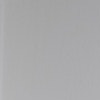

In [25]:
mac.crop((0,0,100,100))

For the mac image this isn't a very useful demonstration. Let's use another image instead:

In [26]:
pencils = Image.open("pencils.jpg")

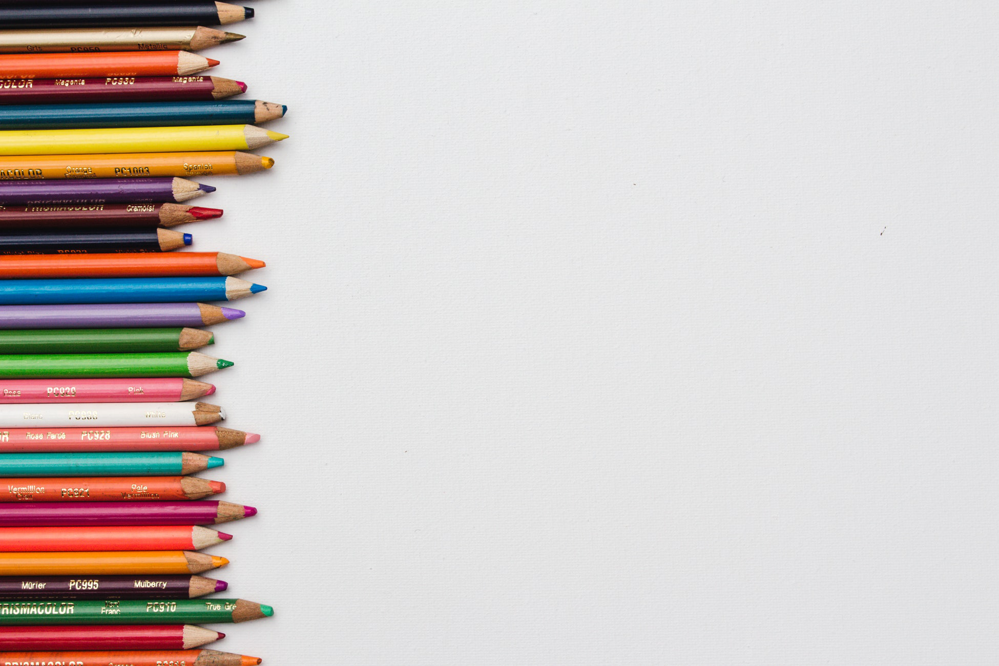

In [27]:
pencils

Now let's attempt to grab some of the top pencils from the corner

In [28]:
pencils.size

(1950, 1300)

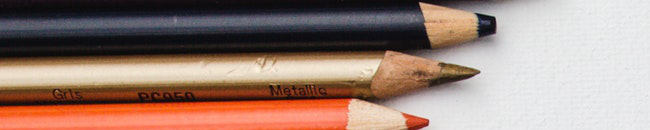

In [29]:
# Start at top corner (0,0)
x = 0
y = 0

# Grab about 10% in y direction , and about 30% in x direction
w = 1950/3
h = 1300/10

pencils.crop((x,y,w,h))

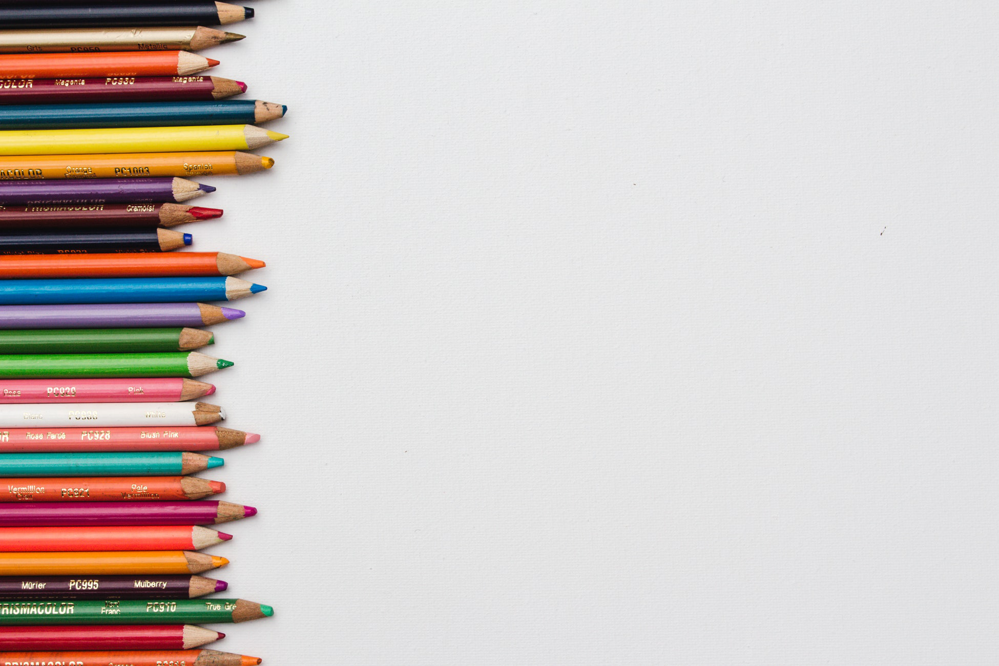

In [30]:
pencils

Now let's try the pencils from the bottom

In [14]:
pencils.size

(1950, 1300)

In [15]:
x = 0 
y = 1100
w = 1950/3
h = 1300

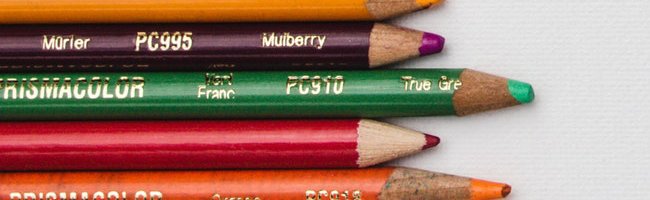

In [16]:
pencils.crop((x,y,w,h))

Now let's go back to the mac photo and see if we can only grab the computer itself:

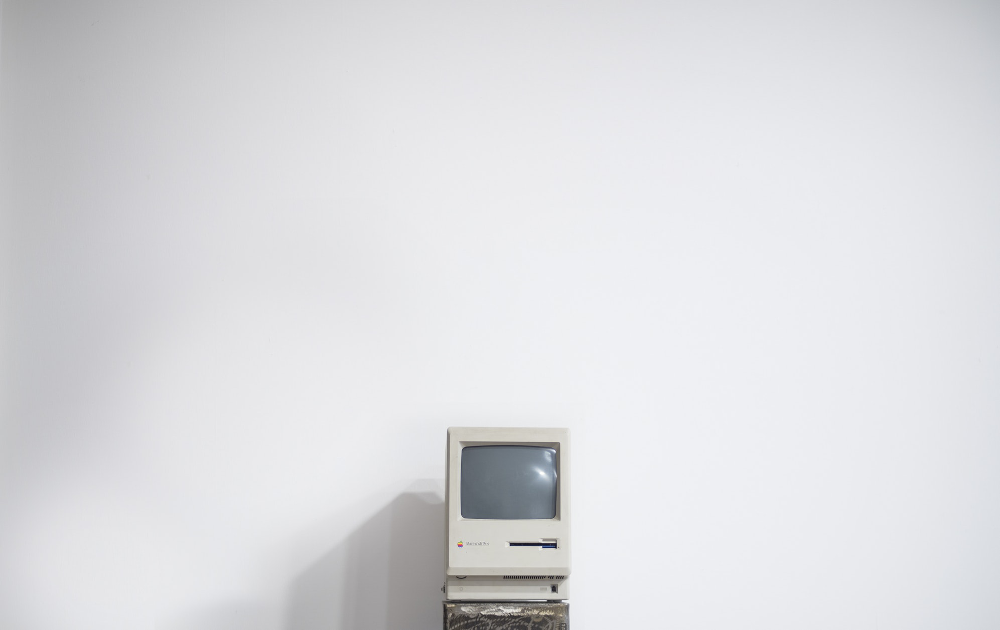

In [17]:
mac

In [18]:
mac.size

(1993, 1257)

In [19]:
halfway = 1993/2

In [20]:
x = halfway - 200
w = halfway + 200

In [21]:
y = 800
h = 1257

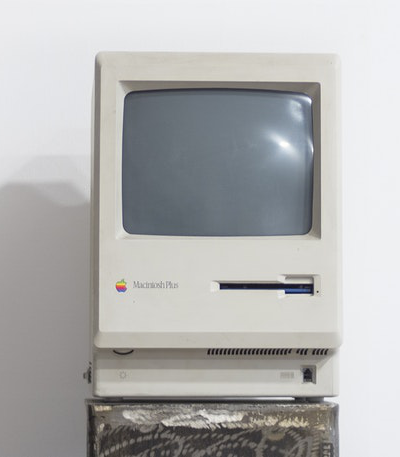

In [22]:
mac.crop((x,y,w,h))

### Copying and Pasting Images

We can create copies with the copy() method and paste images on top of others with the paste() method.

In [23]:
computer = mac.crop((x,y,w,h))

In [24]:
mac.paste(im=computer,box=(0,0))

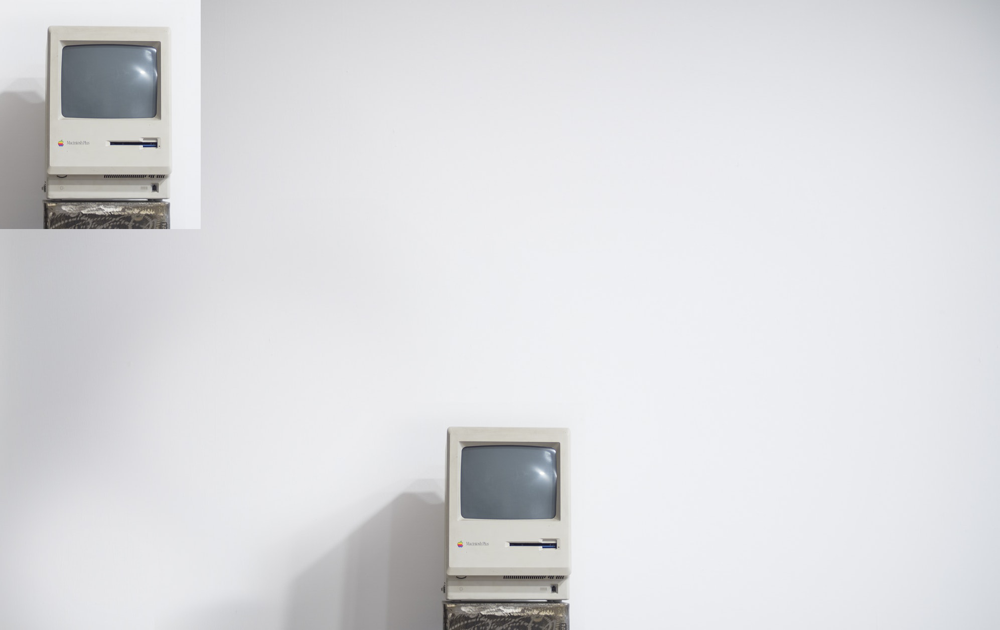

In [25]:
mac

In [26]:
mac.paste(im=computer,box=(796,0))

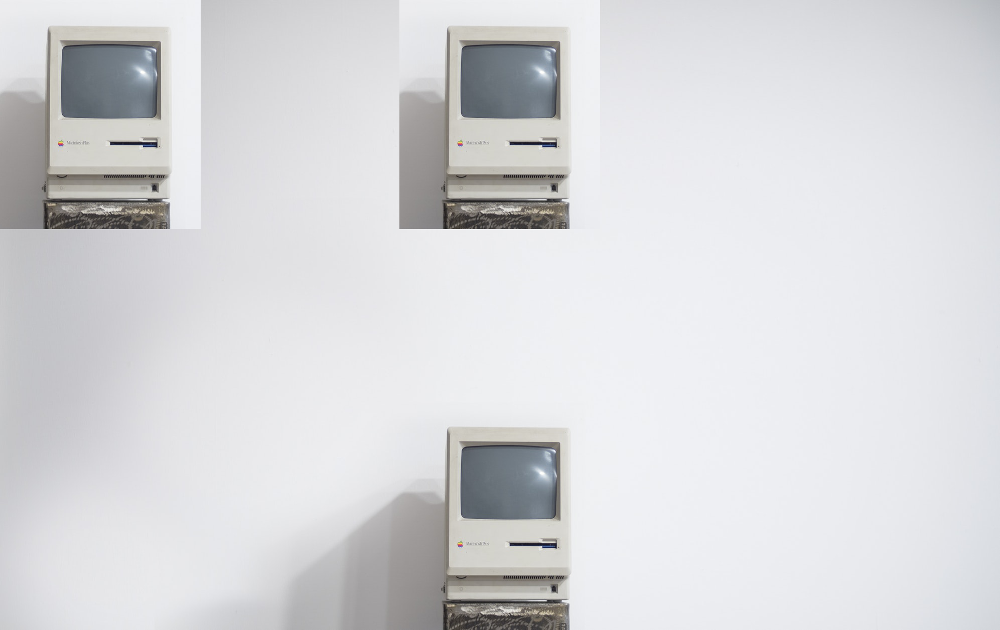

In [27]:
mac

### Resizing

You can use the resize() method to resize an image

In [28]:
mac.size

(1993, 1257)

In [29]:
h,w = mac.size

In [30]:
new_h = int(h/3)
new_w = int(w/3)

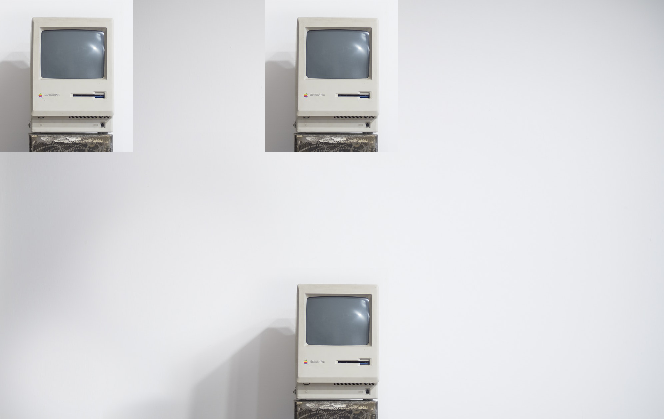

In [31]:
# Note this is not permanent change
# for permanent change, do a reassignment
# e.g. mac = mac.resize((100,100))
mac.resize((new_h,new_w))

Can also stretch and squeeze

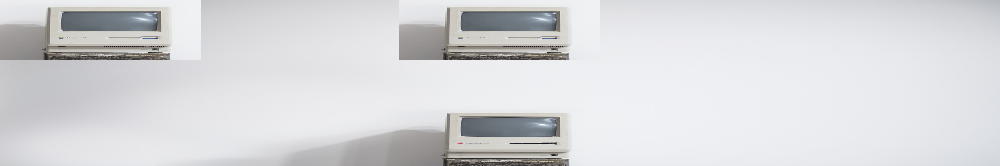

In [32]:
mac.resize((3000,500))

### Rotating Images

You can rotate images by specifying the amount of degrees to rotate on the rotate() method. The original dimensions will be kept and "filled" in with black. You can optionally pass in the expand parameter to fill the new rotated image to the old dimensions.

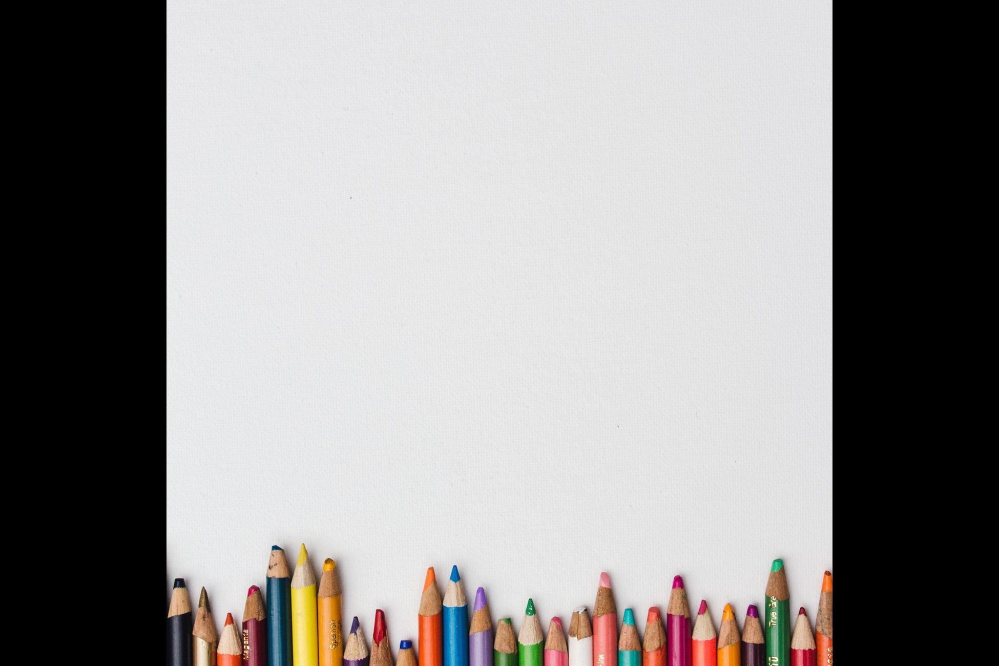

In [33]:
pencils.rotate(90)

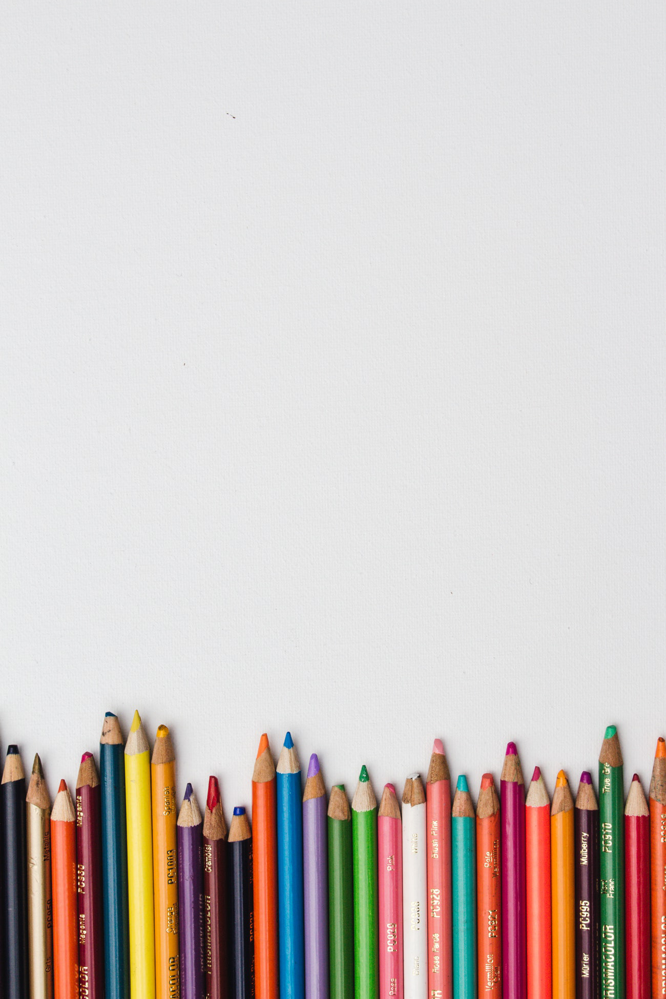

In [34]:
pencils.rotate(90,expand=True)

Notice what happens when we rotate by 120.

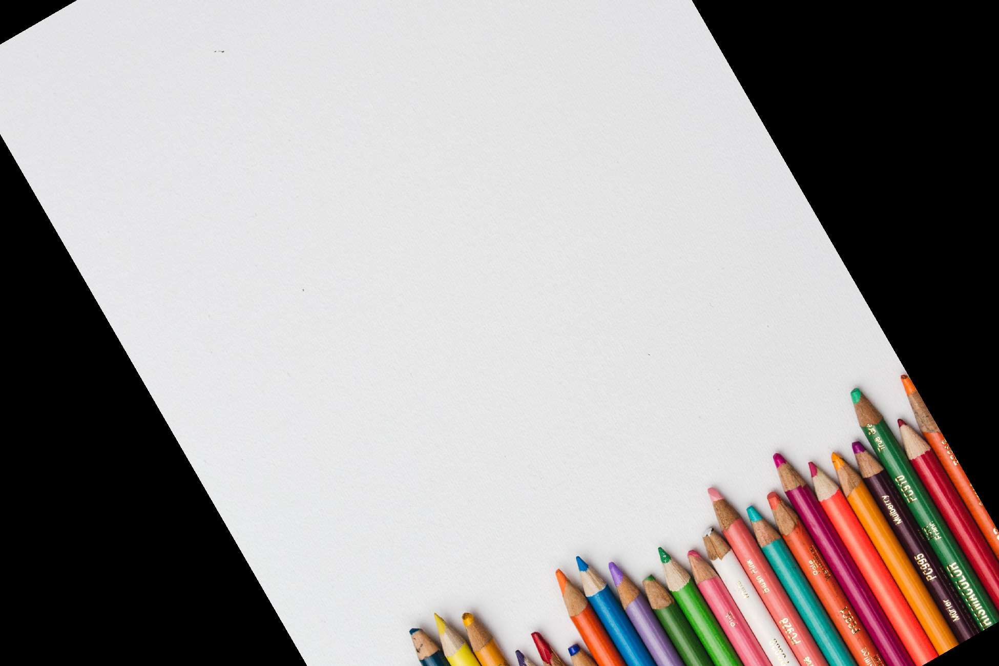

In [35]:
# The image is cut off
pencils.rotate(120)

In [36]:
#pencils.rotate(120,expand=True)

## Transparency  

We can add an alpha value (RGBA stands for RED,Green,Blue, Alpha) where values can go from 0 to 255. If Alpha is 0 the image is completely transparent, if it is 255 then its completely opaque.

You can create your own color here to check for possible values: https://developer.mozilla.org/en-US/docs/Web/CSS/CSS_Colors/Color_picker_tool

We can adjust image alpha values with the putalpha() method:

In [37]:
red = Image.open('red_color.jpg')

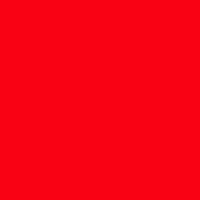

In [38]:
red

In [39]:
blue = Image.open('blue_color.png')

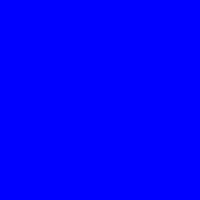

In [40]:
blue

In [41]:
red.putalpha(128)

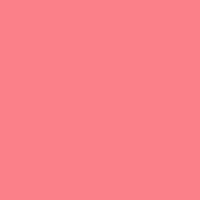

In [42]:
red

In [43]:
blue.putalpha(128)

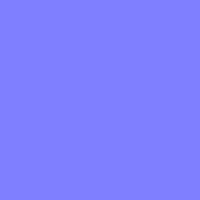

In [44]:
blue

In [45]:
blue.paste(red,box=(0,0),mask=red)

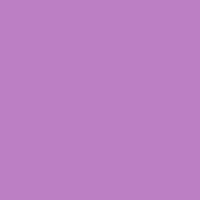

In [46]:
# Get back an image that is more purple.
blue

Transparency and masking can be much more complex than what we've shown here, if you find yourself needing something more, check out the documentation: https://pillow.readthedocs.io/en/stable/

## Saving Images

Let's save this updated "blue" image as 'purple.png' in this folder.

In [47]:
blue.save("purple.png")

Let's check to make sure that worked:

In [48]:
purple = Image.open("purple.png")

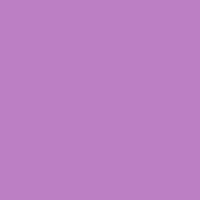

In [49]:
purple

Great job!